# Classification of Different Dog Species using Tensorflow

### 1. Problem

Breed identification of a dog

### 2. Data

Data is obtained from Kaggle, you can see it in the link below: 

https://www.kaggle.com/competitions/dog-breed-identification/data

### 3. Evaluation

Evaluation is gonna be done with the metric: **Multi Class Log Loss**

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

### 4. Features

1. Data is unstructured
2. 120 breeds of dogs

In [1]:
cd "/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/"

/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification


In [2]:
ls

custom/                   logs/                  test/
functions.py              models/                test_predictions.csv
generated_submission.csv  __pycache__/           train/
labels.csv                sample_submission.csv


No need to run this cell anymore, commented

In [3]:
# !unzip dog-breed-identification.zip

## Arrange the Workspace

Import all the packages needed in this project

Change the number of images that the model is trained on using slider

In [4]:
#from functions import *

import tensorflow as tf
print("Tensorflow version:", tf.__version__)

import tensorflow_hub as hub
print("Tensorflow HUB version:", hub.__version__)

from matplotlib.pyplot import imread
import pandas as pd
from IPython.display import Image
import os
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split


# Check for GPU availability
print("GPU available!" if tf.config.list_physical_devices("GPU") else "Not available :(")

Tensorflow version: 2.11.0
Tensorflow HUB version: 0.12.0
GPU available!


## 1. Get the Data Ready

Data needs to be in numerical format. Hence, turn the images into tensors first.

In [5]:
labels = pd.read_csv("/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/labels.csv")

print(labels.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [6]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


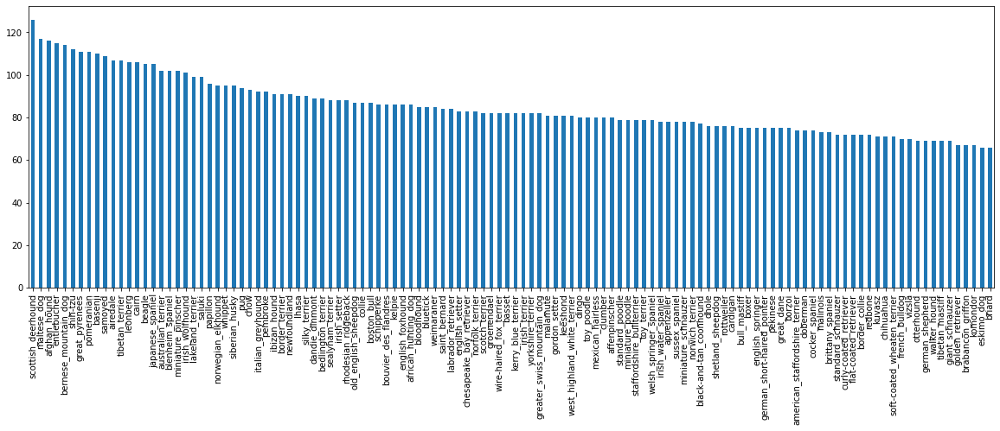

In [7]:
labels["breed"].value_counts().plot.bar(figsize=(20,6));

In average, there are 85 pictures per breed to train the model

In [8]:
labels["breed"].value_counts().mean()

85.18333333333334

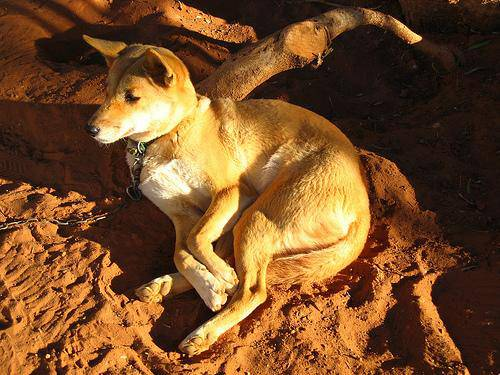

In [9]:
Image("/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images and the Labels

Create pathways from image IDs

In [10]:
filenames = ["/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/train/" + fname + ".jpg" for fname in labels["id"]]

In [11]:
filenames[:5]

['/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [12]:
len(filenames)

10222

### Check if the number of images is consistent with the number of IDs

In [13]:
if len(os.listdir("/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/train")) == len(filenames):
  print("Ready to go!")
else:
  print("Not ready, check the directory again!")

Ready to go!


In [14]:
labels["breed"][4500]

'keeshond'

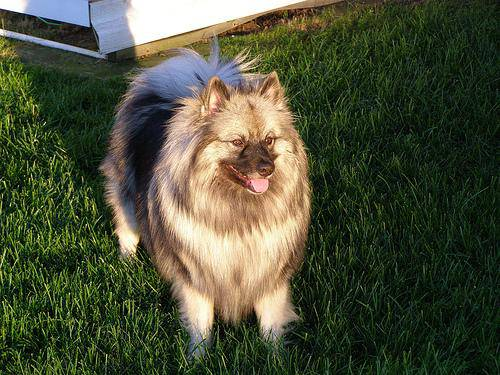

In [15]:
Image(filenames[4500])

### Prepare the labels

In [16]:
train_labels = labels["breed"].to_numpy()
print(train_labels)

unique_breeds = np.unique(train_labels)
train_labels = [label == np.array(unique_breeds) for label in train_labels]
#train_labels = pd.Categorical(train_labels).codes

['boston_bull' 'dingo' 'pekinese' ... 'airedale' 'miniature_pinscher'
 'chesapeake_bay_retriever']


In [17]:
train_labels[1]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

### Create a validation set

In [18]:
x = filenames
y = train_labels

Split the data into train and validation using NUM_IMAGES

In [19]:
NUM_IMAGES = 10000 #@param {type:'slider', min:1000, max:10000, step:100}

In [20]:
x_tr, x_vl, y_tr, y_vl = train_test_split(x[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

In [21]:
len(x_tr), len(x_vl), len(y_tr), len(y_vl)

(8000, 2000, 8000, 2000)

### Turn the images into tensors

* Take an image file path
* Read and save the image
* Turn the image into tensors
* Normalize the image values
* Resize the image
* Return the modified image

Also, it is important to feed the model with the proper size of picture since models are trained on a specific image size

In [22]:
# Defining an image size
IMG_SIZE = 224

# Define the batch size, 32 is a good default
BATCH_SIZE = 32

In [23]:
im = imread(filenames[23])
im.shape

(210, 291, 3)

In [24]:
im.max(), im.min()

(255, 0)

In [25]:
# Create a function for preprocessing images
def process_img(image_path, img_size = IMG_SIZE):
  """
  Defining a function to preprocess the images
  """
  # Read-in an image file
  image = tf.io.read_file(image_path)
  # Turn the image into numerical Tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values to values betwee 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### Turning the data into batches

When all images are tried to be processed in one go, they all might not fit in the memory

Thats why it is done with 32 images at a time. And to use Tensorflow, we need our data in the form of Tensor tuples which looks like this: (image, label)

In [26]:
# Create a simple function to return a tuple (image, label)

def get_img_label(image_path, label):
  image = process_img(image_path)
  return image, label

In [27]:
# Create a function to turn data into batches
def turn_to_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_img).batch(BATCH_SIZE)
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_img_label).batch(BATCH_SIZE)

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_img_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [28]:
train_data = turn_to_batches(x_tr, y_tr)
val_data = turn_to_batches(x_vl, y_vl, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [29]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualize the batches

In [30]:
# Function for viewing images in a batch
def show_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(20, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

In [31]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

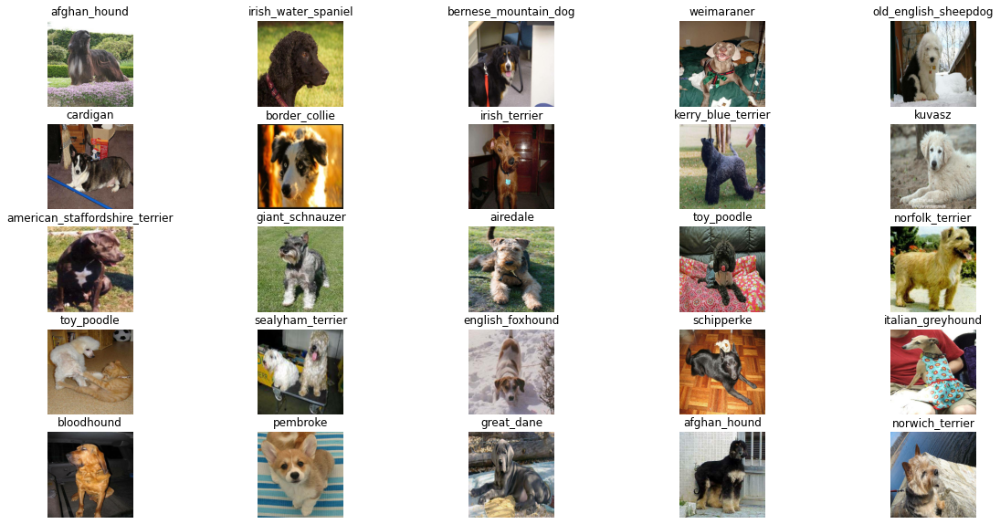

In [32]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_images(train_images, train_labels)

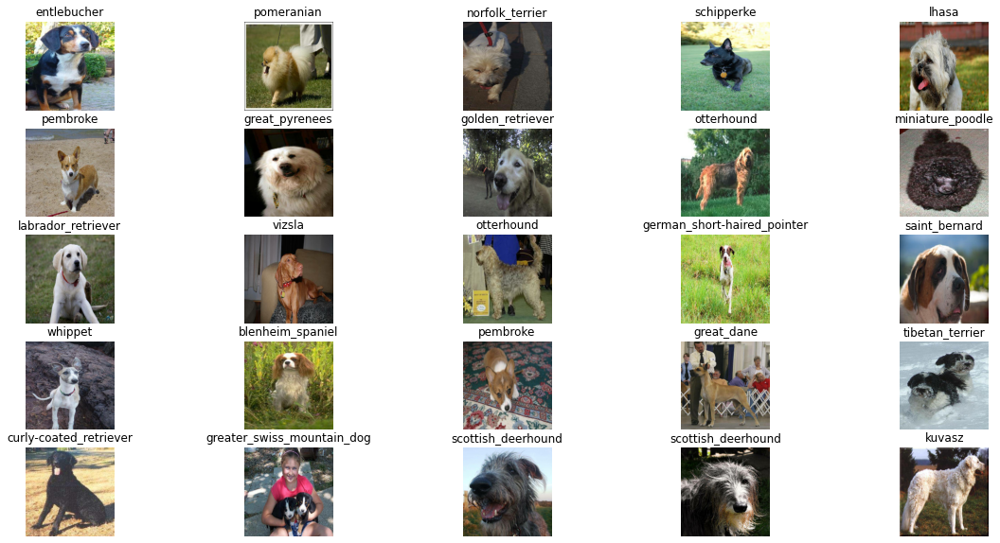

In [33]:
# Visualize training images from the training data batch
valid_images, valid_labels = next(val_data.as_numpy_iterator())
show_images(valid_images, valid_labels)

## 2. Creating the model for the classification



Before we build a model, few things to define:
* The input shape of our model.
* The output shape of our model.
* The URL of the model.

In [34]:
INPUT_FORMAT = [None, IMG_SIZE, IMG_SIZE, 3]

OUTPUT_FORMAT = len(unique_breeds)

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Lets put together a colab function to generate the Keras model. Function will:

* Take input, output shape and also the model itself
* Define the layers of the model
* Compiles the model
* Builds the model
* Returns the model

In [35]:
def create_model(in_shape=INPUT_FORMAT, out_shape=OUTPUT_FORMAT, md_url=MODEL_URL):

  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL),
    tf.keras.layers.Dense(units=OUTPUT_FORMAT, 
                          activation="softmax")
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this
      optimizer=tf.keras.optimizers.Adam(), # How to improve its guesses
      metrics=["accuracy"] # We want to improve this metric
  )

  # Build the model
  model.build(INPUT_FORMAT) # Let the model know what kind of inputs it'll be getting
  
  return model

In [36]:
md = create_model()
md.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callbacks

We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

**TensorBoard Callback**

[TensorBoard](https://www.tensorflow.org/tensorboard/get_started) helps provide a visual way to monitor the progress of your model during and after training.

It can be used [directly in a notebook](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) to track the performance measures of a model such as loss and accuracy.

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize the our models training logs using the `%tensorboard` magic function
**Early Stopping Callback**

[Early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize, overfit).

In [37]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
import datetime

# Function for TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs, so the logs get tracked whenever we run an experiment
  logdir = os.path.join("/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # Stops after 3 rounds of no improvements

### Training process

Start with training the model only with first 1000 pictures. We do this to make sure everything is working. We can step it up later and train on the entire training dataset.

The final parameter we'll define before training is **number of epochs**. `NUM_EPOCHS` defines how many passes of the data we'd like our model to do. If `NUM_EPOCHS=1`, the model will only look at the data once and will probably score badly because it hasn't a chance to correct itself.

What's a good value for `NUM_EPOCHS`?

This one is hard to say. 10 could be a good start but so could 100. This is one of the reasons we created an early stopping callback. Having early stopping setup means if we set `NUM_EPOCHS` to 100 but our model stops improving after 22 epochs, it'll stop training.

In [38]:
# Check again if GPU is available (otherwise computing will take a long time)
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available


Define the number of epochs that the model will be trained on

In [39]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:110, step:10}

Create the function to train the models:

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for and the callbacks we'd like to use
* Return the fitted model.

In [40]:
def train_model(es_callback):
  
  md = create_model()
  tb_callback = create_tensorboard_callback()

  # Fit the model to the data
  md.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tb_callback, es_callback])
  
  return md

In [41]:
md = train_model(early_stopping)

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
250/250 [==============================] - 183s 494ms/step - loss: 1.5508 - accuracy: 0.6254 - val_loss: 0.7396 - val_accuracy: 0.7820
Epoch 2/100
250/250 [==============================] - 38s 151ms/step - loss: 0.4087 - accuracy: 0.8829 - val_loss: 0.6527 - val_accuracy: 0.8015
Epoch 3/100
250/250 [==============================] - 34s 135ms/step - loss: 0.2304 - accuracy: 0.9433 - val_loss: 0.6338 - val_accuracy: 0.8070
Epoch 4/100
250/250 [==============================] - 33s 133ms/step - loss: 0.1429 - accuracy: 0.9699 - val_loss: 0.6480 - val_accuracy: 0.8040
Epoch 5/100
250/250 [==============================] - 33s 133ms/step - loss: 0.1000 - accuracy: 0.9844 - val_loss: 0.6470 - val_accuracy: 0.8025
Epoch 6/100
250/250 [==============================] - 35s 138ms/step - loss: 0.0717 - accuracy: 0.9914 - val_loss: 0.6599 - val_accuracy: 0.8035


**Checking the TensorBoard logs:**

Now the model has been trained, we can make its performance visual by checking the TensorBoard logs. The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and viualize its contents.

In [42]:
%tensorboard --logdir /content/drive/MyDrive/Machine\ Learning\ Projects/dog-breed-identification/logs

<IPython.core.display.Javascript object>

## 3. Make and transform predictions

In [43]:
# Make predictions on the validation data
predictions = md.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

63/63 [==============================] - 9s 126ms/step


array([[4.5713545e-08, 7.1830236e-10, 7.7508551e-09, ..., 8.0744931e-09,
        1.3878983e-07, 8.7350344e-10],
       [3.8750977e-06, 1.9305527e-07, 1.0829259e-08, ..., 9.7295050e-10,
        3.2739131e-08, 1.9770359e-07],
       [1.5289519e-03, 4.8575883e-05, 3.1629883e-05, ..., 3.7988543e-06,
        9.5636537e-04, 1.2218534e-03],
       ...,
       [3.8086560e-05, 9.4125382e-05, 4.7812176e-07, ..., 7.6491533e-06,
        3.0685653e-05, 3.1484021e-03],
       [4.2376808e-08, 8.5306375e-08, 5.4263007e-09, ..., 4.7084669e-07,
        2.2219229e-04, 2.8819937e-07],
       [6.1502305e-07, 2.3968183e-05, 2.2270896e-09, ..., 2.5811605e-08,
        7.9826877e-06, 3.1583299e-06]], dtype=float32)

In [44]:
predictions.shape

(2000, 120)

In [45]:
np.sum(predictions[0]), np.sum(predictions[1])

(1.0, 0.9999998)

In [46]:
# Create a function to unbatch a batched dataset
# def unbatchify(data):
#   """
#   Takes a batched dataset of (image, label) Tensors and returns separate arrays
#   of images and labels.
#   """
#   images = []
#   labels = []
#   # Loop through unbatched data
#   for image, label in data.unbatch().as_numpy_iterator():
#     images.append(image)
#     labels.append(unique_breeds[np.argmax(label)])
#   return images, labels

# def show_result(pred_prob, batch_ds):
#   np.max(pred_prob[INDEX]

#   plt.imshow(image)
#   plt.xticks([])
#   plt.yticks([])

#   if pred_label == true_label:
#     color = "green"
#   else:
#     color = "red"

#   plt.title("{} {:2.0f}% ({})".format(),
#                                       np.max(pred_prob)*100,
#                                       true_label),
#                                       color=color)

**To see how well the validation predictions are:**

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's combine them to visualize all these items. More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

In [47]:
INDEX = 7 #@param {type:"slider", min:0, max:2000, step:1}

First, function to return the breed with the highest probability (come up with a prediction)

In [48]:
def get_pred_label(pred):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(pred)]

In [49]:
get_pred_label(predictions[0])

'entlebucher'

Then a function to get the validation set image and its label

In [50]:
def get_image(batch_ds, idx=INDEX):
  it_num = int(idx/BATCH_SIZE)
  it_rem = idx%BATCH_SIZE
  iter = batch_ds.as_numpy_iterator()
  for i in range(it_num):
    next(iter)
  imgs, label = next(iter)
  return imgs[it_rem], label[it_rem]

Finally, a function to visualize all

In [51]:
#print(predictions[INDEX])
def plot_prediction(predictions, batch_dataset, idx = INDEX):
  max_prob = np.max(predictions[idx])
  #print(f"Max value (probability of prediction): {max_prob}") # the max probability value predicted by the model
  #print(f"Sum: {np.sum(predictions[INDEX])}") # because we used softmax activation in our model, this will be close to 1
  #print(f"Max index: {np.argmax(predictions[idx])}") # the index of where the max value in predictions[0] occurs
  img, lbl = get_image(batch_dataset, idx)

  pred_label = unique_breeds[np.argmax(predictions[idx])]
  true_label = unique_breeds[np.argmax(lbl)]

  #print(f"Predicted label: {pred_label}") # the predicted label
  #print(f"Actual label: {true_label}") # the actual label

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])
  plt.title("{} {:2.0f}% ({})".format(pred_label, max_prob*100, true_label),
                                        color=color);

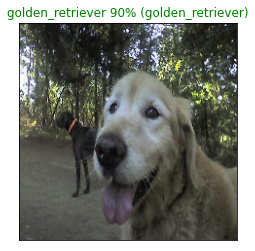

In [52]:
plot_prediction(predictions, val_data)

To see what other predictions our model is making, we will write another function. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

So, lets find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
  * Plot the top 10 prediction probability values and labels, coloring the true label green.

In [53]:
def plot_pred_probs(predictions, labels, index=INDEX):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob = predictions[index]
  true_label = unique_breeds[np.argmax(labels)]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction indices
  top_10__indices = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_values = pred_prob[top_10__indices]
  # Find the top 10 prediction labels
  top_10_labels = unique_breeds[top_10__indices]

  # Setup plot
  #plt.figure(figsize=(25, 8))
  top_plot = plt.bar(np.arange(len(top_10_labels)), 
                     top_10_values, 
                     color="gray")
  plt.xticks(np.arange(len(top_10_labels)),
             labels=top_10_labels,
             rotation="vertical")

  # Change color of the true label
  if np.isin(true_label, top_10_labels):
    top_plot[np.argmax(top_10_labels == true_label)].set_color("green")
  else:
    pass
  return top_plot

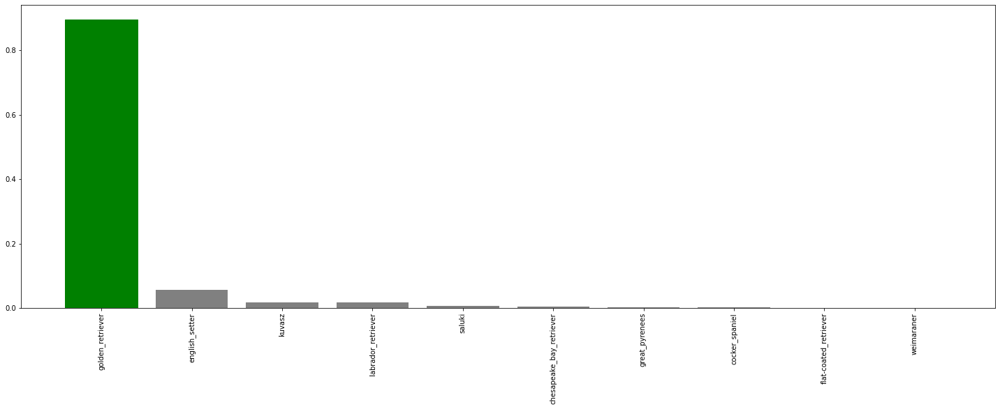

In [54]:
_, lbl = get_image(val_data)
plt.figure(figsize=(25, 8))
plot_pred_probs(predictions, lbl);

Now lets combine the generated functions

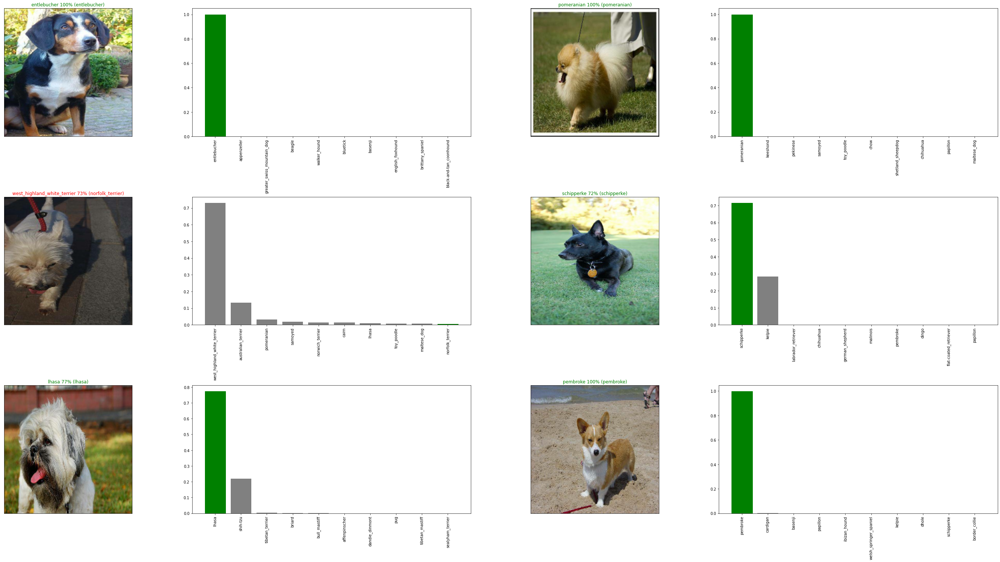

In [55]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols

plt.figure(figsize=(10*2*num_cols, 7*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)

  plot_prediction(predictions=predictions,
                  batch_dataset=val_data, idx=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)

  _, lbl = get_image(val_data, idx=i+i_multiplier)
  plot_pred_probs(predictions=predictions,
                labels=lbl,
                index=i+i_multiplier)
  
plt.tight_layout(h_pad=1.0)
plt.show()

## 4. Saving and reloading a model

Create a function to save the model

In [56]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory.
  """
  # Create model directory with current time
  modeldir = os.path.join("/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print("Saving model to:",model_path)
  model.save(model_path)
  return model_path

And to load the model

In [57]:
def load_model(model_path):
  """
  Loads a saved model from path.
  """
  print("Loading saved model from:",model_path)
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [58]:
# Save our model trained on 8000 images
save_model(md, suffix="8000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/models/20230303-14331677854022-8000-images-mobilenetv2-Adam.h5


'/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/models/20230303-14331677854022-8000-images-mobilenetv2-Adam.h5'

You can see that these two models are the same

In [60]:
# Load our model trained on 1000 images
md_loaded = load_model('/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/models/20230210-16021676044973-8000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/models/20230210-16021676044973-8000-images-mobilenetv2-Adam.h5


In [61]:
md_loaded.evaluate(val_data)

63/63 [==============================] - 8s 123ms/step - loss: 0.7159 - accuracy: 0.8025


[0.7159286737442017, 0.8025000095367432]

In [62]:
md.evaluate(val_data)

63/63 [==============================] - 8s 124ms/step - loss: 0.6599 - accuracy: 0.8035


[0.6599423885345459, 0.8034999966621399]

## 5. Make the predictions on the test set

Model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format

In [63]:
path = "/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/test/"
filenames = [path + fname for fname in os.listdir(path)]
filenames[:5]

['/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/test/e702ddff98bd0b05ab200ffb43fb080a.jpg',
 '/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/test/e732916519751eaa0cb2ba0cc1217ab9.jpg',
 '/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/test/e806fbb5ca4dd3a094f7819bd810cc65.jpg',
 '/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/test/e6a544a538088cc3f73b432a2da90134.jpg',
 '/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/test/e7f95aabf775a636b3893ffa120adaf9.jpg']

In [64]:
len(filenames)

10357

In [65]:
test_data = turn_to_batches(filenames, test_data=True)
test_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [66]:
test_predictions = md_loaded.predict(test_data, verbose=1)

324/324 [==============================] - 160s 483ms/step


In [67]:
test_predictions.shape

(10357, 120)

In [68]:
test_predictions[1]

array([1.07860103e-08, 1.48029056e-09, 1.14999593e-10, 3.44406892e-10,
       6.73079814e-10, 1.17688181e-09, 8.38745695e-09, 4.17299501e-10,
       1.90049256e-08, 1.20899939e-08, 6.26655533e-11, 1.53477572e-06,
       7.05766140e-11, 9.99979615e-01, 1.40604939e-09, 9.61815694e-09,
       9.79828485e-09, 3.92602478e-10, 7.06191633e-11, 3.39130751e-10,
       2.85009183e-10, 2.28051600e-09, 1.54746582e-09, 1.00664494e-11,
       1.35572137e-07, 2.69332695e-10, 2.15888044e-10, 3.00757086e-10,
       1.28519018e-11, 1.78605930e-08, 5.72098979e-10, 1.24590276e-08,
       1.10411993e-05, 2.96197067e-10, 4.45304340e-12, 6.33302122e-09,
       4.08841405e-09, 1.80670704e-11, 9.65059456e-12, 8.38865311e-10,
       5.85131366e-09, 2.18350582e-08, 7.26760518e-09, 1.29209382e-12,
       5.32945799e-10, 5.89515139e-08, 1.91426791e-10, 1.35409045e-11,
       1.10226698e-11, 7.02116187e-09, 5.07286373e-08, 1.30715066e-11,
       1.76019935e-10, 1.90132091e-10, 1.24617483e-10, 4.82002216e-09,
      

In [69]:
np.savetxt("/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/test_predictions.csv", test_predictions, delimiter=",")

In [70]:
test_predictions = np.loadtxt("/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/test_predictions.csv", delimiter=",")

## 6. Uploading the predictions to Kaggle

Format is an id column and probability column for each breed of dog in the dataset. So lets first create a dataframe:

In [71]:
test_path = "/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/test/"

ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
ids[:5]

['e702ddff98bd0b05ab200ffb43fb080a',
 'e732916519751eaa0cb2ba0cc1217ab9',
 'e806fbb5ca4dd3a094f7819bd810cc65',
 'e6a544a538088cc3f73b432a2da90134',
 'e7f95aabf775a636b3893ffa120adaf9']

In [73]:
df_submission = pd.DataFrame(columns=["id"] + list(unique_breeds)) 
df_submission["id"] = ids
df_submission[list(unique_breeds)] = test_predictions

df_submission.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e702ddff98bd0b05ab200ffb43fb080a,8.471021e-04,2.908317e-05,2.903867e-06,6.471502e-08,2.360765e-07,1.665619e-07,1.421923e-06,3.617302e-07,7.975756e-07,...,2.837367e-06,7.135981e-07,2.283648e-09,3.464723e-09,9.237393e-09,9.502853e-08,6.391758e-06,1.495867e-07,8.036210e-05,2.740378e-05
1,e732916519751eaa0cb2ba0cc1217ab9,1.078601e-08,1.480291e-09,1.149996e-10,3.444069e-10,6.730798e-10,1.176882e-09,8.387457e-09,4.172995e-10,1.900493e-08,...,4.973614e-09,1.355607e-11,3.938100e-10,5.074272e-10,1.005525e-10,4.003808e-07,5.390768e-10,1.076337e-11,4.644911e-09,1.742735e-09
2,e806fbb5ca4dd3a094f7819bd810cc65,6.154156e-06,1.759005e-06,1.190598e-07,2.060443e-02,2.497594e-07,4.126139e-07,1.967474e-04,6.418370e-07,2.383570e-08,...,6.353644e-07,7.439594e-06,2.969197e-06,1.936705e-06,7.915684e-08,2.195021e-06,8.499885e-07,2.771547e-06,8.345220e-01,1.463704e-04
3,e6a544a538088cc3f73b432a2da90134,1.541222e-09,2.416537e-07,4.436565e-05,6.417790e-10,2.890510e-08,1.102950e-10,2.949634e-07,1.526592e-05,3.805613e-04,...,7.939654e-09,4.143760e-06,1.306784e-09,8.472101e-09,1.466840e-09,1.119006e-05,1.257628e-06,2.045162e-05,3.659538e-06,1.960006e-09
4,e7f95aabf775a636b3893ffa120adaf9,5.227726e-01,1.526654e-07,7.326192e-07,1.924949e-09,1.241757e-06,2.619047e-08,3.134932e-05,1.422743e-07,6.671518e-08,...,2.293490e-04,5.545219e-07,1.451536e-07,1.414315e-08,3.314235e-07,1.929920e-08,9.377838e-08,2.014473e-08,2.197411e-07,2.781026e-04


In [74]:
df_submission.to_csv("/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/generated_submission.csv", index=False)

## 7. Making predictions on custom images

In [75]:
custom_path = "/content/drive/MyDrive/Machine Learning Projects/dog-breed-identification/custom/"
img_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [76]:
custom_data = turn_to_batches(img_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [77]:
results = md_loaded.predict(custom_data)

1/1 [==============================] - 1s 987ms/step


In [78]:
results.shape

(4, 120)

In [79]:
custom_pred_labels = [get_pred_label(results[i]) for i in range(len(results))]
custom_pred_labels

['golden_retriever', 'appenzeller', 'siberian_husky', 'maltese_dog']

In [80]:
custom_imgs = []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_imgs.append(image)

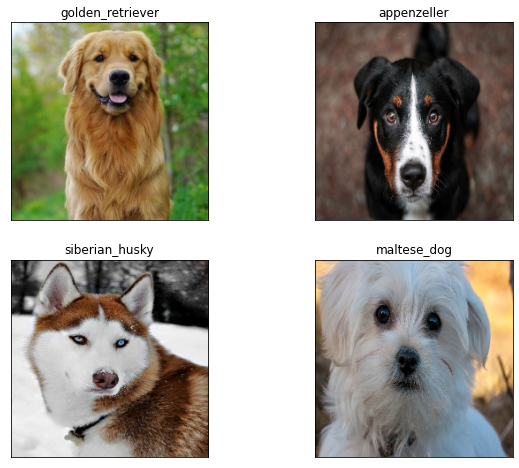

In [81]:
plt.figure(figsize=(10,8))
for i, image in enumerate(custom_imgs):
  plt.subplot(2, 2, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)